# Load dependencies

In [1]:
import pandas as pd
import numpy as np
from sklearn.metrics import silhouette_score,confusion_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectFromModel
from sklearn.model_selection import train_test_split
from sklearn import tree
from sklearn.manifold import TSNE
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
import scipy
from scipy.signal import savgol_filter
from scipy.spatial.distance import pdist,squareform
import torch
from matplotlib import pyplot as plt
import umap

from IPython.display import clear_output
import seaborn as sns
sns.set()

# Load Data

In [2]:
emb1 = pd.read_csv('../results/trained_embs_all/AllEmbs_MI_a375.csv',index_col=0)
emb1 = emb1.drop_duplicates()
emb1['cell'] = 'A375'
emb2 = pd.read_csv('../results/trained_embs_all/AllEmbs_MI_ht29.csv',index_col=0)
emb2 = emb2.drop_duplicates()
emb2['cell'] = 'HT29'

all_embs = pd.concat((emb1,emb2),axis=0)
all_embs = all_embs.sample(frac=1)
all_embs.cell = 1*(all_embs.cell=='A375')
all_embs

,z0,z1,z2,z3,z4,z5,z6,z7,z8,z9,...,z1015,z1016,z1017,z1018,z1019,z1020,z1021,z1022,z1023,cell
CPC006_A375_24H:BRD-A18763547-300-04-8:10,0.662318,-0.112933,0.110743,0.145343,-0.702719,0.091882,0.295838,-0.171512,-0.430852,-0.588899,...,-0.828910,-0.318115,-0.142107,0.757181,-0.671207,-0.585325,-0.170765,-0.284268,-0.651031,1
CPC010_HT29_6H:BRD-A18411371-001-10-6:10,-0.059234,0.146496,-0.093485,0.171003,0.057836,-0.134185,-0.348090,0.041579,0.059398,-0.194475,...,0.060282,0.251675,0.120012,-0.008030,-0.215101,-0.074033,-0.253513,0.119649,0.375086,0
PBIOA020_HT29_24H:C01,0.116984,-0.435744,0.081844,0.080289,0.049716,-0.433754,0.286655,-0.091337,0.536911,-0.253135,...,-0.245471,0.163877,-0.355733,0.087068,-0.048026,0.020464,-0.570431,0.619460,0.015913,0
DOSBIO001_A375_24H:BRD-K19011062:10.0222,-0.112050,-0.273806,-0.093494,-0.009340,0.961075,0.363929,-0.335741,-0.127927,-0.390920,0.121202,...,0.117971,-0.648170,-0.240478,0.215262,-0.364045,0.012068,0.113673,-0.254907,0.087118,1
DOSVAL002_HT29_24H:BRD-K14002526:20,0.208100,-0.292714,0.125594,-0.887491,0.943486,0.110612,-0.524363,-0.597213,-0.123940,-0.035311,...,-0.465924,-0.171631,-0.843946,0.259166,-0.334898,0.022797,-0.240033,-0.389109,-0.208504,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MOAR006_A375_24H:I10,0.194787,0.739074,0.511731,0.022069,-0.417457,0.235718,-0.690584,-0.085523,-0.199146,0.503518,...,-0.416310,0.211850,0.067419,-0.015314,-0.863914,0.187551,0.139609,-0.449060,0.686665,1
REP.A021_A375_24H:O16,0.348711,0.087241,0.054677,0.119564,-0.111394,-0.264725,0.132213,-1.036888,-0.118621,0.052560,...,-0.075807,-0.525226,0.241273,-0.367425,0.231039,0.238010,-0.007005,0.132951,0.474130,1
REP.A016_A375_24H:L07,0.449428,0.225181,-0.030397,0.262169,-0.422950,-0.128312,0.312803,-0.399022,0.195864,-0.028825,...,-0.353355,-0.156472,-0.474204,0.036015,-0.292276,-0.650792,-0.084577,0.208242,0.105691,1
CPC013_A375_6H:BRD-U82589721-000-01-4:10,-0.534131,-0.508294,-0.267562,0.136229,-0.894744,-0.583616,0.618169,-0.154727,0.070987,-0.296823,...,-0.565180,0.373012,0.930236,0.109051,-0.765775,0.027441,-0.209861,-0.049803,0.616199,1


In [3]:
# Gex data 
cmap = pd.read_csv('../preprocessing/preprocessed_data/cmap_HT29_A375.csv',index_col=0)
gene_size = len(cmap.columns)
sampleInfo_1 = pd.read_csv('../preprocessing/preprocessed_data/10fold_validation_spit/alldata/a375_unpaired.csv',index_col=0)
sampleInfo_2 = pd.read_csv('../preprocessing/preprocessed_data/10fold_validation_spit/alldata/ht29_unpaired.csv',index_col=0)
sampleInfo_paired = pd.read_csv('../preprocessing/preprocessed_data/10fold_validation_spit/alldata/paired_a375_ht29.csv',index_col=0)
l1 = len(pd.concat((sampleInfo_1.sig_id,sampleInfo_paired['sig_id.x'])).drop_duplicates())
l2 = len(pd.concat((sampleInfo_2.sig_id,sampleInfo_paired['sig_id.y'])).drop_duplicates())
cmap = cmap.loc[pd.concat((sampleInfo_1.sig_id,sampleInfo_paired['sig_id.x'],
                            sampleInfo_2.sig_id,sampleInfo_paired['sig_id.y'])).drop_duplicates().reset_index(drop=True),
                 :].drop_duplicates()
cmap['cell'] = 0
cmap.iloc[0:l1,-1] = 1
cmap = cmap.sample(frac=1)
X = cmap.iloc[:,:-1].values
Y = cmap.iloc[:,-1].values

In [4]:
X = cmap.iloc[:,:-1].values
Y = cmap.iloc[:,-1].values

In [5]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.2)

In [6]:
# dataTrain, dataTest = train_test_split(all_embs.reset_index(drop=True), test_size = 0.2)

In [7]:
# dataTrain = dataTrain.reset_index(drop=True)
# dataTest = dataTest.reset_index(drop=True)

In [8]:
dataset = torch.utils.data.TensorDataset(torch.tensor(X_train).float(),torch.tensor(Y_train).long())

# Train classifier

In [4]:
device = torch.device('cuda')

In [5]:
class CellBinaryClassifier(torch.nn.Module):
    def __init__(self,in_channel,hidden_layers,drop_in=0.5,drop=0.2,bn=0.6,bias=True,dtype=None):
        super(CellBinaryClassifier, self).__init__()
        self.drop_in = drop_in
        self.num_hidden_layers = len(hidden_layers)
        self.bias = bias
        self.bn = torch.nn.ModuleList()
        self.linear_layers = torch.nn.ModuleList()
        self.dropouts = torch.nn.ModuleList()
        self.activations = torch.nn.ModuleList()
        self.linear_layers.append(torch.nn.Linear(in_channel, hidden_layers[0], bias=bias,dtype=dtype))
        self.bn.append(torch.nn.BatchNorm1d(num_features=hidden_layers[0], momentum=bn,dtype=dtype))
        self.dropouts.append(torch.nn.Dropout(drop))
        self.activations.append(torch.nn.ReLU())
        for i in range(1, len(hidden_layers)):
            self.linear_layers.append(torch.nn.Linear(hidden_layers[i - 1], hidden_layers[i], 
                                                      bias=bias,dtype=dtype))
            self.bn.append(torch.nn.BatchNorm1d(num_features=hidden_layers[i], momentum=bn,
                                                dtype=dtype))
            self.dropouts.append(torch.nn.Dropout(drop))
            self.activations.append(torch.nn.ReLU())
        self.out_linear = torch.nn.Linear(hidden_layers[i],2,bias=bias,dtype=dtype)
        self.softmax = torch.nn.Softmax(dim=1)
        if self.drop_in>0:
            self.InputDrop = torch.nn.Dropout(self.drop_in)
        
        self.init_emb()

    def init_emb(self):
        for m in self.modules():
            if isinstance(m, torch.nn.Linear):
                torch.nn.init.xavier_uniform_(m.weight.data)
                if m.bias is not None:
                    m.bias.data.fill_(0.0)
    
    def forward(self,x):
        if self.drop_in>0:
            x = self.InputDrop(x)
        for i in range(self.num_hidden_layers):
            x = self.linear_layers[i](x)
            x = self.bn[i](x)
            x = self.activations[i](x)
            x = self.dropouts[i](x)
            
        return self.softmax(self.out_linear(x))
    
    def L2Regularization(self, L2):

        weightLoss = 0.
        biasLoss = 0.
        for i in range(self.num_hidden_layers):
            weightLoss = weightLoss + L2 * torch.sum((self.linear_layers[i].weight)**2)
            if self.bias==True:
                biasLoss = biasLoss + L2 * torch.sum((self.linear_layers[i].bias)**2)
        L2Loss = biasLoss + weightLoss
        return(L2Loss)

In [6]:
# Create a train generators
def getSamples(N, batchSize):
    order = np.random.permutation(N)
    outList = []
    while len(order)>0:
        outList.append(order[0:batchSize])
        order = order[batchSize:]
    return outList

In [7]:
# model = CellBinaryClassifier(in_channel=1024,hidden_layers=[512,256,128,64,32]).to(device)
criterion = torch.nn.CrossEntropyLoss()
bs=128
k_folds=10
NUM_EPOCHS=1000
#N = Y_train.size
kfold=KFold(n_splits=k_folds,shuffle=True)
# optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

In [8]:
bs_1 = 178
bs_2 =  154
bs_paired =  90

Fold=0, Epoch=1/1000, L2 Loss=10.4500, Entropy Loss=0.6667, loss=11.1167, Accuracy=0.5714, F1 score=0.6538
Fold=0, Epoch=51/1000, L2 Loss=0.3326, Entropy Loss=0.5159, loss=0.8485, Accuracy=0.7857, F1 score=0.8000
Fold=0, Epoch=101/1000, L2 Loss=0.2744, Entropy Loss=0.4829, loss=0.7573, Accuracy=0.8333, F1 score=0.8444
Fold=0, Epoch=151/1000, L2 Loss=0.3371, Entropy Loss=0.4969, loss=0.8340, Accuracy=0.8095, F1 score=0.8095
Fold=0, Epoch=201/1000, L2 Loss=0.3188, Entropy Loss=0.4131, loss=0.7319, Accuracy=0.9048, F1 score=0.9048
Fold=0, Epoch=251/1000, L2 Loss=0.3050, Entropy Loss=0.4593, loss=0.7644, Accuracy=0.8571, F1 score=0.8696
Fold=0, Epoch=301/1000, L2 Loss=0.2912, Entropy Loss=0.3775, loss=0.6688, Accuracy=0.9286, F1 score=0.9268
Fold=0, Epoch=351/1000, L2 Loss=0.2787, Entropy Loss=0.4098, loss=0.6885, Accuracy=0.9048, F1 score=0.9091
Fold=0, Epoch=401/1000, L2 Loss=0.3432, Entropy Loss=0.4891, loss=0.8323, Accuracy=0.8333, F1 score=0.8511
Fold=0, Epoch=451/1000, L2 Loss=0.2594

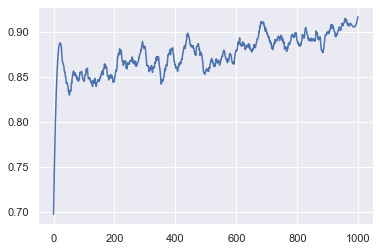

Fold=1, Epoch=1/1000, L2 Loss=10.4690, Entropy Loss=0.6919, loss=11.1609, Accuracy=0.5714, F1 score=0.5263
Fold=1, Epoch=51/1000, L2 Loss=0.3472, Entropy Loss=0.4881, loss=0.8354, Accuracy=0.8095, F1 score=0.8000
Fold=1, Epoch=101/1000, L2 Loss=0.3119, Entropy Loss=0.4347, loss=0.7466, Accuracy=0.8810, F1 score=0.8889
Fold=1, Epoch=151/1000, L2 Loss=0.3033, Entropy Loss=0.4388, loss=0.7421, Accuracy=0.8571, F1 score=0.8571
Fold=1, Epoch=201/1000, L2 Loss=0.3456, Entropy Loss=0.3679, loss=0.7135, Accuracy=0.9524, F1 score=0.9524
Fold=1, Epoch=251/1000, L2 Loss=0.3278, Entropy Loss=0.4272, loss=0.7550, Accuracy=0.8571, F1 score=0.8571
Fold=1, Epoch=301/1000, L2 Loss=0.3508, Entropy Loss=0.4599, loss=0.8107, Accuracy=0.8571, F1 score=0.8500
Fold=1, Epoch=351/1000, L2 Loss=0.2843, Entropy Loss=0.4528, loss=0.7371, Accuracy=0.8571, F1 score=0.8636
Fold=1, Epoch=401/1000, L2 Loss=0.2799, Entropy Loss=0.4417, loss=0.7216, Accuracy=0.8333, F1 score=0.8511
Fold=1, Epoch=451/1000, L2 Loss=0.2730

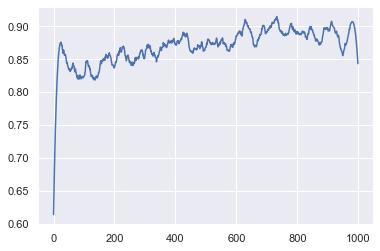

Fold=2, Epoch=1/1000, L2 Loss=10.4589, Entropy Loss=0.7129, loss=11.1717, Accuracy=0.4524, F1 score=0.5306
Fold=2, Epoch=51/1000, L2 Loss=0.3209, Entropy Loss=0.4924, loss=0.8133, Accuracy=0.7857, F1 score=0.7805
Fold=2, Epoch=101/1000, L2 Loss=0.3046, Entropy Loss=0.4948, loss=0.7994, Accuracy=0.8095, F1 score=0.8261
Fold=2, Epoch=151/1000, L2 Loss=0.3079, Entropy Loss=0.5213, loss=0.8292, Accuracy=0.7857, F1 score=0.8000
Fold=2, Epoch=201/1000, L2 Loss=0.3017, Entropy Loss=0.3945, loss=0.6962, Accuracy=0.9286, F1 score=0.9302
Fold=2, Epoch=251/1000, L2 Loss=0.3135, Entropy Loss=0.4720, loss=0.7855, Accuracy=0.8333, F1 score=0.8293
Fold=2, Epoch=301/1000, L2 Loss=0.2878, Entropy Loss=0.4217, loss=0.7095, Accuracy=0.9048, F1 score=0.9048
Fold=2, Epoch=351/1000, L2 Loss=0.3038, Entropy Loss=0.5123, loss=0.8161, Accuracy=0.7857, F1 score=0.7805
Fold=2, Epoch=401/1000, L2 Loss=0.2584, Entropy Loss=0.3776, loss=0.6360, Accuracy=0.9286, F1 score=0.9302
Fold=2, Epoch=451/1000, L2 Loss=0.2873

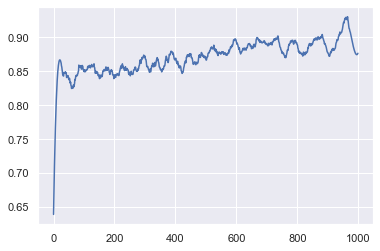

Fold=3, Epoch=1/1000, L2 Loss=10.5322, Entropy Loss=0.7127, loss=11.2449, Accuracy=0.5476, F1 score=0.5366
Fold=3, Epoch=51/1000, L2 Loss=0.3499, Entropy Loss=0.4221, loss=0.7720, Accuracy=0.9048, F1 score=0.9048
Fold=3, Epoch=101/1000, L2 Loss=0.3803, Entropy Loss=0.4471, loss=0.8274, Accuracy=0.8333, F1 score=0.8293
Fold=3, Epoch=151/1000, L2 Loss=0.3254, Entropy Loss=0.4563, loss=0.7817, Accuracy=0.8571, F1 score=0.8571
Fold=3, Epoch=201/1000, L2 Loss=0.3432, Entropy Loss=0.4474, loss=0.7906, Accuracy=0.8810, F1 score=0.8780
Fold=3, Epoch=251/1000, L2 Loss=0.3158, Entropy Loss=0.4713, loss=0.7871, Accuracy=0.8333, F1 score=0.8444
Fold=3, Epoch=301/1000, L2 Loss=0.3411, Entropy Loss=0.3871, loss=0.7282, Accuracy=0.9286, F1 score=0.9268
Fold=3, Epoch=351/1000, L2 Loss=0.2858, Entropy Loss=0.4380, loss=0.7238, Accuracy=0.8571, F1 score=0.8571
Fold=3, Epoch=401/1000, L2 Loss=0.3399, Entropy Loss=0.3957, loss=0.7357, Accuracy=0.9286, F1 score=0.9268
Fold=3, Epoch=451/1000, L2 Loss=0.2893

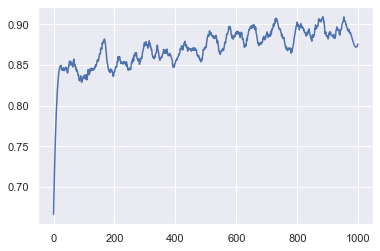

Fold=4, Epoch=1/1000, L2 Loss=10.4664, Entropy Loss=0.6417, loss=11.1081, Accuracy=0.5952, F1 score=0.5143
Fold=4, Epoch=51/1000, L2 Loss=0.2998, Entropy Loss=0.4036, loss=0.7034, Accuracy=0.9048, F1 score=0.9048
Fold=4, Epoch=101/1000, L2 Loss=0.3103, Entropy Loss=0.4779, loss=0.7882, Accuracy=0.8333, F1 score=0.8372
Fold=4, Epoch=151/1000, L2 Loss=0.2999, Entropy Loss=0.4377, loss=0.7377, Accuracy=0.8571, F1 score=0.8636
Fold=4, Epoch=201/1000, L2 Loss=0.3204, Entropy Loss=0.3965, loss=0.7169, Accuracy=0.9048, F1 score=0.9000
Fold=4, Epoch=251/1000, L2 Loss=0.2736, Entropy Loss=0.4868, loss=0.7604, Accuracy=0.8333, F1 score=0.8293
Fold=4, Epoch=301/1000, L2 Loss=0.3091, Entropy Loss=0.4145, loss=0.7236, Accuracy=0.9048, F1 score=0.9091
Fold=4, Epoch=351/1000, L2 Loss=0.2831, Entropy Loss=0.4173, loss=0.7004, Accuracy=0.9048, F1 score=0.9048
Fold=4, Epoch=401/1000, L2 Loss=0.2980, Entropy Loss=0.4148, loss=0.7128, Accuracy=0.9048, F1 score=0.9130
Fold=4, Epoch=451/1000, L2 Loss=0.3136

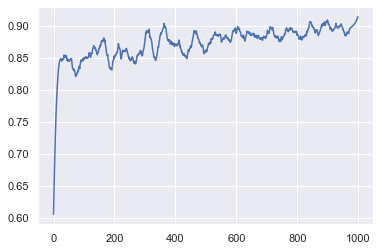

Fold=5, Epoch=1/1000, L2 Loss=10.5384, Entropy Loss=0.7590, loss=11.2974, Accuracy=0.4524, F1 score=0.4390
Fold=5, Epoch=51/1000, L2 Loss=0.3847, Entropy Loss=0.4346, loss=0.8193, Accuracy=0.8571, F1 score=0.8636
Fold=5, Epoch=101/1000, L2 Loss=0.3421, Entropy Loss=0.4734, loss=0.8155, Accuracy=0.8095, F1 score=0.8095
Fold=5, Epoch=151/1000, L2 Loss=0.3188, Entropy Loss=0.5168, loss=0.8356, Accuracy=0.7857, F1 score=0.7805
Fold=5, Epoch=201/1000, L2 Loss=0.3201, Entropy Loss=0.4997, loss=0.8198, Accuracy=0.7857, F1 score=0.8000
Fold=5, Epoch=251/1000, L2 Loss=0.3134, Entropy Loss=0.5226, loss=0.8359, Accuracy=0.7619, F1 score=0.7619
Fold=5, Epoch=301/1000, L2 Loss=0.3443, Entropy Loss=0.4516, loss=0.7959, Accuracy=0.8571, F1 score=0.8571
Fold=5, Epoch=351/1000, L2 Loss=0.3050, Entropy Loss=0.4564, loss=0.7615, Accuracy=0.8571, F1 score=0.8500
Fold=5, Epoch=401/1000, L2 Loss=0.3027, Entropy Loss=0.3488, loss=0.6515, Accuracy=0.9762, F1 score=0.9767
Fold=5, Epoch=451/1000, L2 Loss=0.3008

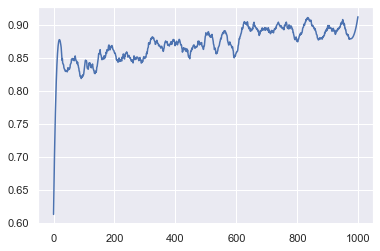

Fold=6, Epoch=1/1000, L2 Loss=10.5146, Entropy Loss=0.6406, loss=11.1552, Accuracy=0.7381, F1 score=0.7660
Fold=6, Epoch=51/1000, L2 Loss=0.3167, Entropy Loss=0.4523, loss=0.7689, Accuracy=0.8810, F1 score=0.8780
Fold=6, Epoch=101/1000, L2 Loss=0.2912, Entropy Loss=0.3980, loss=0.6892, Accuracy=0.9286, F1 score=0.9268
Fold=6, Epoch=151/1000, L2 Loss=0.2946, Entropy Loss=0.3699, loss=0.6645, Accuracy=0.9524, F1 score=0.9545
Fold=6, Epoch=201/1000, L2 Loss=0.3122, Entropy Loss=0.4334, loss=0.7457, Accuracy=0.8571, F1 score=0.8571
Fold=6, Epoch=251/1000, L2 Loss=0.2741, Entropy Loss=0.4873, loss=0.7614, Accuracy=0.7857, F1 score=0.7907
Fold=6, Epoch=301/1000, L2 Loss=0.3351, Entropy Loss=0.4201, loss=0.7552, Accuracy=0.8810, F1 score=0.8889
Fold=6, Epoch=351/1000, L2 Loss=0.2790, Entropy Loss=0.4072, loss=0.6861, Accuracy=0.9048, F1 score=0.9000
Fold=6, Epoch=401/1000, L2 Loss=0.2871, Entropy Loss=0.4666, loss=0.7537, Accuracy=0.8333, F1 score=0.8293
Fold=6, Epoch=451/1000, L2 Loss=0.2848

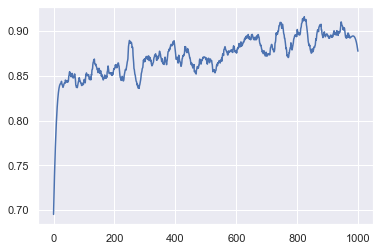

Fold=7, Epoch=1/1000, L2 Loss=10.4997, Entropy Loss=0.6560, loss=11.1557, Accuracy=0.5476, F1 score=0.5957
Fold=7, Epoch=51/1000, L2 Loss=0.3348, Entropy Loss=0.4538, loss=0.7886, Accuracy=0.8571, F1 score=0.8636
Fold=7, Epoch=101/1000, L2 Loss=0.3071, Entropy Loss=0.4310, loss=0.7381, Accuracy=0.8810, F1 score=0.8837
Fold=7, Epoch=151/1000, L2 Loss=0.2927, Entropy Loss=0.4425, loss=0.7352, Accuracy=0.8571, F1 score=0.8636
Fold=7, Epoch=201/1000, L2 Loss=0.3219, Entropy Loss=0.4759, loss=0.7979, Accuracy=0.8095, F1 score=0.8182
Fold=7, Epoch=251/1000, L2 Loss=0.3586, Entropy Loss=0.4142, loss=0.7728, Accuracy=0.9048, F1 score=0.9048
Fold=7, Epoch=301/1000, L2 Loss=0.3151, Entropy Loss=0.4253, loss=0.7404, Accuracy=0.8810, F1 score=0.8837
Fold=7, Epoch=351/1000, L2 Loss=0.3186, Entropy Loss=0.4659, loss=0.7845, Accuracy=0.8095, F1 score=0.7895
Fold=7, Epoch=401/1000, L2 Loss=0.2960, Entropy Loss=0.4905, loss=0.7865, Accuracy=0.8095, F1 score=0.8000
Fold=7, Epoch=451/1000, L2 Loss=0.2681

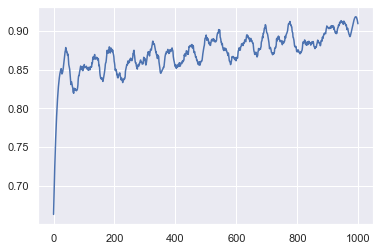

Fold=8, Epoch=1/1000, L2 Loss=10.5368, Entropy Loss=0.6691, loss=11.2059, Accuracy=0.5476, F1 score=0.5128
Fold=8, Epoch=51/1000, L2 Loss=0.3286, Entropy Loss=0.4514, loss=0.7800, Accuracy=0.8571, F1 score=0.8571
Fold=8, Epoch=101/1000, L2 Loss=0.3124, Entropy Loss=0.4656, loss=0.7781, Accuracy=0.8095, F1 score=0.8182
Fold=8, Epoch=151/1000, L2 Loss=0.2539, Entropy Loss=0.4405, loss=0.6944, Accuracy=0.8571, F1 score=0.8636
Fold=8, Epoch=201/1000, L2 Loss=0.3563, Entropy Loss=0.4755, loss=0.8319, Accuracy=0.8333, F1 score=0.8372
Fold=8, Epoch=251/1000, L2 Loss=0.3142, Entropy Loss=0.4639, loss=0.7781, Accuracy=0.8571, F1 score=0.8571
Fold=8, Epoch=301/1000, L2 Loss=0.3369, Entropy Loss=0.4236, loss=0.7605, Accuracy=0.8810, F1 score=0.8837
Fold=8, Epoch=351/1000, L2 Loss=0.3078, Entropy Loss=0.3643, loss=0.6720, Accuracy=0.9524, F1 score=0.9524
Fold=8, Epoch=401/1000, L2 Loss=0.2730, Entropy Loss=0.3986, loss=0.6716, Accuracy=0.9048, F1 score=0.9048
Fold=8, Epoch=451/1000, L2 Loss=0.2769

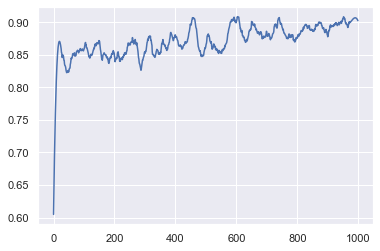

Fold=9, Epoch=1/1000, L2 Loss=10.2968, Entropy Loss=0.7420, loss=11.0388, Accuracy=0.5476, F1 score=0.1739
Fold=9, Epoch=51/1000, L2 Loss=0.3132, Entropy Loss=0.4885, loss=0.8017, Accuracy=0.8095, F1 score=0.8095
Fold=9, Epoch=101/1000, L2 Loss=0.3110, Entropy Loss=0.4596, loss=0.7706, Accuracy=0.8571, F1 score=0.8696
Fold=9, Epoch=151/1000, L2 Loss=0.3150, Entropy Loss=0.4925, loss=0.8075, Accuracy=0.8095, F1 score=0.8333
Fold=9, Epoch=201/1000, L2 Loss=0.2965, Entropy Loss=0.3896, loss=0.6862, Accuracy=0.9286, F1 score=0.9268
Fold=9, Epoch=251/1000, L2 Loss=0.3121, Entropy Loss=0.4282, loss=0.7403, Accuracy=0.8810, F1 score=0.8889
Fold=9, Epoch=301/1000, L2 Loss=0.3417, Entropy Loss=0.4538, loss=0.7955, Accuracy=0.8810, F1 score=0.8837
Fold=9, Epoch=351/1000, L2 Loss=0.3156, Entropy Loss=0.4237, loss=0.7393, Accuracy=0.9286, F1 score=0.9268
Fold=9, Epoch=401/1000, L2 Loss=0.2868, Entropy Loss=0.4117, loss=0.6985, Accuracy=0.9286, F1 score=0.9333
Fold=9, Epoch=451/1000, L2 Loss=0.2646

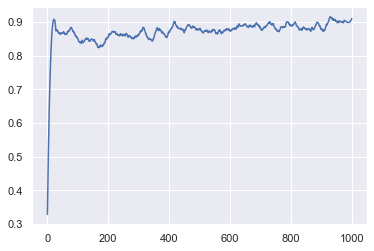

In [9]:
valF1 = []
valAcc = []
valPrec = []
valRec = []
#for fold,(train_idx,test_idx) in enumerate(kfold.split(dataset)):
for fold in range(10):    
    trainInfo_paired = pd.read_csv('../preprocessing/preprocessed_data/10fold_validation_spit/train_paired_%s.csv'%fold,index_col=0)
    trainInfo_1 = pd.read_csv('../preprocessing/preprocessed_data/10fold_validation_spit/train_a375_%s.csv'%fold,index_col=0)
    trainInfo_2 = pd.read_csv('../preprocessing/preprocessed_data/10fold_validation_spit/train_ht29_%s.csv'%fold,index_col=0)
    
    valInfo_paired = pd.read_csv('../preprocessing/preprocessed_data/10fold_validation_spit/val_paired_%s.csv'%fold,index_col=0)
    valInfo_1 = pd.read_csv('../preprocessing/preprocessed_data/10fold_validation_spit/val_a375_%s.csv'%fold,index_col=0)
    valInfo_2 = pd.read_csv('../preprocessing/preprocessed_data/10fold_validation_spit/val_ht29_%s.csv'%fold,index_col=0)
    
    #xtrain,ytrain = dataset[train_idx]
    #xtest,ytest = dataset[test_idx]
    #N = ytrain.shape[0]
    N_paired = len(trainInfo_paired)
    N_1 = len(trainInfo_1)
    N_2 = len(trainInfo_2)
    N = N_1
    if N_2>N:
        N=N_2
    model = CellBinaryClassifier(in_channel=1024,hidden_layers=[512,256,128],drop_in=0.5,drop=0.2).to(device)
    #model = CellBinaryClassifier(in_channel=gene_size,hidden_layers=[2048,4096,1024,512,256,128],drop_in=0.5,drop=0.2).to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
    scheduler = torch.optim.lr_scheduler.StepLR(optimizer,
                                                step_size=300,
                                                gamma=0.8)
    trainAcc = []
    for e in range(NUM_EPOCHS):
        model.train()
        #trainloader = getSamples(N, bs)
        trainloader_1 = getSamples(N_1, bs_1)
        len_1 = len(trainloader_1)
        trainloader_2 = getSamples(N_2, bs_2)
        len_2 = len(trainloader_2)
        trainloader_paired = getSamples(N_paired, bs_paired)
        len_paired = len(trainloader_paired)
        lens = [len_1,len_2,len_paired]
        maxLen = np.max(lens)
        if maxLen>lens[0]:
            trainloader_suppl = getSamples(N_1, bs_1)
            for jj in range(maxLen-lens[0]):
                trainloader_1.insert(jj,trainloader_suppl[jj])
        if maxLen>lens[1]:
            trainloader_suppl = getSamples(N_2, bs_2)
            for jj in range(maxLen-lens[1]):
                trainloader_2.insert(jj,trainloader_suppl[jj])
        if maxLen>lens[2]:
            trainloader_suppl = getSamples(N_paired, bs_paired)
            for jj in range(maxLen-lens[2]):
                trainloader_paired.insert(jj,trainloader_suppl[jj])
        
        #for dataIndex in trainloader:
        for j in range(maxLen):
            dataIndex_1 = trainloader_1[j]
            dataIndex_2 = trainloader_2[j]
            dataIndex_paired = trainloader_paired[j]
            
            df_pairs = trainInfo_paired.iloc[dataIndex_paired,:]
            df_1 = trainInfo_1.iloc[dataIndex_1,:]
            df_2 = trainInfo_2.iloc[dataIndex_2,:]
            paired_inds = len(df_pairs)
            
            #X_1 = torch.tensor(np.concatenate((cmap.loc[df_pairs['sig_id.x'],cmap.columns!='cell'].values,
            #                                     cmap.loc[df_1.sig_id,cmap.columns!='cell'].values))).float().detach()
            #X_2 = torch.tensor(np.concatenate((cmap.loc[df_pairs['sig_id.y'],cmap.columns!='cell'].values,
            #                                     cmap.loc[df_2.sig_id,cmap.columns!='cell'].values))).float().detach()
            
            X_1 = torch.tensor(np.concatenate((all_embs.loc[df_pairs['sig_id.x'],all_embs.columns!='cell'].values,
                                                 all_embs.loc[df_1.sig_id,all_embs.columns!='cell'].values))).float().detach()
            X_2 = torch.tensor(np.concatenate((all_embs.loc[df_pairs['sig_id.y'],all_embs.columns!='cell'].values,
                                                 all_embs.loc[df_2.sig_id,all_embs.columns!='cell'].values))).float().detach()
            
            dataIn = torch.cat((X_1,X_2),0).detach().to(device)
            dataOut = torch.cat((torch.ones(X_1.shape[0]),torch.zeros(X_2.shape[0])),0).long()
            
            optimizer.zero_grad()
            #dataIn = xtrain[dataIndex].to(device)
            #dataOut = ytrain[dataIndex].to(device)
            out = model(dataIn)
            L2Loss = model.L2Regularization(1e-2)
            loss = criterion(out, dataOut.to(device)) + L2Loss
            
            loss.backward()
            optimizer.step()
            _, predicted = torch.max(out, 1)
            predicted = predicted.cpu().numpy()
            cf_matrix = confusion_matrix(dataOut.cpu(),predicted)
            tn, fp, fn, tp = cf_matrix.ravel()
            acc = (tp+tn)/predicted.size
            f1 = 2*tp/(2*tp+fp+fn)
        if e%50==0:
            outString = 'Fold={:.0f}'.format(fold)
            outString += ', Epoch={:.0f}/{:.0f}'.format(e+1,NUM_EPOCHS)
            outString += ', L2 Loss={:.4f}'.format(L2Loss.item())
            outString += ', Entropy Loss={:.4f}'.format(loss.item()-L2Loss.item())
            outString += ', loss={:.4f}'.format(loss.item())
            outString += ', Accuracy={:.4f}'.format(acc)
            outString += ', F1 score={:.4f}'.format(f1)
            print(outString)
            #clear_output(wait=True)
        trainAcc.append(f1)
        scheduler.step()
    outString = 'Fold={:.0f}'.format(fold)
    outString += ', Epoch={:.0f}/{:.0f}'.format(e+1,NUM_EPOCHS)
    outString += ', L2 Loss={:.4f}'.format(L2Loss.item())
    outString += ', Entropy Loss={:.4f}'.format(loss.item()-L2Loss.item())
    outString += ', loss={:.4f}'.format(loss.item())
    outString += ', Accuracy={:.4f}'.format(acc)
    outString += ', F1 score={:.4f}'.format(f1)
    print(outString)
    
    model.eval()
    paired_val_inds = len(valInfo_paired)
    #x_1 = torch.tensor(np.concatenate((cmap.loc[valInfo_paired['sig_id.x'],cmap.columns!='cell'].values,
    #                                      cmap.loc[valInfo_1.sig_id,cmap.columns!='cell'].values))).float().detach()
    #x_2 = torch.tensor(np.concatenate((cmap.loc[valInfo_paired['sig_id.y'],cmap.columns!='cell'].values,
    #                                      cmap.loc[valInfo_2.sig_id,cmap.columns!='cell'].values))).float().detach()
    x_1 = torch.tensor(np.concatenate((all_embs.loc[valInfo_paired['sig_id.x'],all_embs.columns!='cell'].values,
                                          all_embs.loc[valInfo_1.sig_id,all_embs.columns!='cell'].values))).float().detach()
    x_2 = torch.tensor(np.concatenate((all_embs.loc[valInfo_paired['sig_id.y'],all_embs.columns!='cell'].values,
                                          all_embs.loc[valInfo_2.sig_id,all_embs.columns!='cell'].values))).float().detach()
    xtest = torch.cat((x_1,x_2),0).detach()
    ytest = torch.cat((torch.ones(x_1.shape[0]),torch.zeros(x_2.shape[0])),0).long().numpy()
    
    test_out = model(xtest.to(device))
    _, predicted = torch.max(test_out, 1)
    predicted = predicted.cpu().numpy()
    cf_matrix = confusion_matrix(ytest,predicted)
    tn, fp, fn, tp = cf_matrix.ravel()
    acc = (tp+tn)/predicted.size
    rec = tp/(tp+fn)
    prec = tp/(tp+fp)
    f1 = 2*tp/(2*tp+fp+fn)
    outString = 'Test-set performance: Fold={:.0f}'.format(fold)
    outString += ', Accuracy={:.4f}'.format(acc)
    outString += ', F1 score={:.4f}'.format(f1)
    outString += ', Precision={:.4f}'.format(prec)
    outString += ', Recall={:.4f}'.format(rec)
    print(outString)
    Y = savgol_filter(trainAcc, 51, 3)
    plt.figure()
    plt.plot(range(NUM_EPOCHS),Y)
    #plt.ylim(0,1)
    #plt.yscale('log')
    plt.show()
    valF1.append(f1)
    valAcc.append(acc)
    valPrec.append(prec)
    valRec.append(rec)

In [10]:
print(np.mean(valAcc))
print(np.mean(valF1))
print(np.mean(valPrec))
print(np.mean(valRec))

0.8469565217391304
0.8505260609635663
0.8680520768292957
0.835


In [11]:
print(np.std(valAcc)/np.sqrt(10))
print(np.std(valF1)/np.sqrt(10))
print(np.std(valPrec)/np.sqrt(10))
print(np.std(valRec)/np.sqrt(10))

0.007869445110781748
0.007717886220248611
0.010816529584974461
0.01110555416597179


In [12]:
print(valAcc)
print(valF1)

[0.8043478260869565, 0.8782608695652174, 0.8434782608695652, 0.8652173913043478, 0.8478260869565217, 0.8739130434782608, 0.8521739130434782, 0.8565217391304348, 0.8478260869565217, 0.8]
[0.8085106382978723, 0.8761061946902655, 0.85, 0.8755020080321285, 0.8444444444444444, 0.8765957446808511, 0.8547008547008547, 0.8607594936708861, 0.8535564853556485, 0.8050847457627118]


In [13]:
df = pd.DataFrame({'Acc':valAcc,'F1':valF1})
df.to_csv('../results/allgenes_classifier_trainedEmbs_a375_ht29.csv')

In [ ]:
from sklearn.metrics import confusion_matrix
model.eval()
#Generate the confusion matrix
outputs = model(torch.tensor(X_test).float().to(device)).detach()
_, predicted = torch.max(outputs, 1)
predicted = predicted.cpu().numpy()
cf_matrix = confusion_matrix(Y_test,predicted)
tn, fp, fn, tp = cf_matrix.ravel()
acc = (tp+tn)/predicted.size
rec = tp/(tp+fn)
prec = tp/(tp+fp)
f1 = 2*tp/(2*tp+fp+fn)
print('Accuracy: %s'%acc)
print('Precision: %s'%prec)
print('Recall: %s'%rec)
print('F1 Score: %s'%f1)
ax = sns.heatmap(cf_matrix, annot=True, cmap='Blues')

ax.set_title('Seaborn Confusion Matrix with labels\n\n');
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('True Values ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['False','True'])
ax.yaxis.set_ticklabels(['False','True'])

## Display the visualization of the Confusion Matrix.
plt.show()

In [ ]:
# Train on all data
X = torch.tensor(X).float()
Y = torch.tensor(Y).long()
N = Y.shape[0]
#model = CellBinaryClassifier(in_channel=1024,hidden_layers=[512,256,128],drop_in=0.5,drop=0.25).to(device)
model = CellBinaryClassifier(in_channel=gene_size,hidden_layers=[2048,4096,1024,512,256,128],drop_in=0.5,drop=0.2).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
for e in range(NUM_EPOCHS):
    model.train()
    trainloader = getSamples(N, bs)
    for dataIndex in trainloader:
        optimizer.zero_grad()
        #dataIn,dataOut = dataset[dataIndex]
        dataIn = X[dataIndex].to(device)
        dataOut = Y[dataIndex].to(device)
        out = model(dataIn)
        L2Loss = model.L2Regularization(1e-2)
        loss = criterion(out, dataOut.to(device)) + L2Loss
            
        loss.backward()
        optimizer.step()
        _, predicted = torch.max(out, 1)
        predicted = predicted.cpu().numpy()
        cf_matrix = confusion_matrix(dataOut.cpu(),predicted)
        tn, fp, fn, tp = cf_matrix.ravel()
        acc = (tp+tn)/predicted.size
        f1 = 2*tp/(2*tp+fp+fn)
    if e%50==0:
        outString = ', Epoch={:.0f}/{:.0f}'.format(e+1,NUM_EPOCHS)
        outString += ', L2 Loss={:.4f}'.format(L2Loss.item())
        outString += ', loss={:.4f}'.format(loss.item())
        outString += ', Accuracy={:.4f}'.format(acc)
        outString += ', F1 score={:.4f}'.format(f1)
        print(outString)
        #clear_output(wait=True)
outString = ', Epoch={:.0f}/{:.0f}'.format(e+1,NUM_EPOCHS)
outString += ', L2 Loss={:.4f}'.format(L2Loss.item())
outString += ', loss={:.4f}'.format(loss.item())
outString += ', Accuracy={:.4f}'.format(acc)
outString += ', F1 score={:.4f}'.format(f1)
print(outString)
    
model.eval()
out = model(X.to(device))
_, predicted = torch.max(out, 1)
predicted = predicted.cpu().numpy()
cf_matrix = confusion_matrix(Y,predicted)
tn, fp, fn, tp = cf_matrix.ravel()
acc = (tp+tn)/predicted.size
rec = tp/(tp+fn)
prec = tp/(tp+fp)
f1 = 2*tp/(2*tp+fp+fn)
outString += '\nAll data performance: Accuracy={:.4f}'.format(acc)
outString += ', F1 score={:.4f}'.format(f1)
outString += ', Precision={:.4f}'.format(prec)
outString += ', Recall={:.4f}'.format(rec)
print(outString)

ax = sns.heatmap(cf_matrix, annot=True, cmap='Blues')

ax.set_title('Seaborn Confusion Matrix with labels\n\n');
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('True Values ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['False','True'])
ax.yaxis.set_ticklabels(['False','True'])

## Display the visualization of the Confusion Matrix.
plt.show()

In [ ]:
# torch.save(model,'../results/trained_models/gex_classifier.pth')

# Find important latent features to make classification

In [6]:
# model = torch.load('../results/trained_models/gex_classifier.pth')
# model = model.to(device)

In [8]:
from captum.attr import IntegratedGradients
from captum.attr import LayerConductance
from captum.attr import NeuronConductance

In [9]:
ig = IntegratedGradients(model)
X = X.to(device)
X.requires_grad_()
attr1 = ig.attribute(X,target=1,n_steps=50, return_convergence_delta=False)
attr1 = attr1.detach().cpu().numpy()

In [10]:
attr2 = ig.attribute(X,target=0,n_steps=50, return_convergence_delta=False)
attr2 = attr2.detach().cpu().numpy()

In [ ]:
# # Helper method to print importances and visualize distribution
# def visualize_importances(feature_names, importances, title="Average Feature Importances", plot=True, axis_title="Features"):
#     print(title)
#     for i in range(len(feature_names)):
#         print(feature_names[i], ": ", '%.3f'%(importances[i]))
#     x_pos = (np.arange(len(feature_names)))
#     if plot:
#         plt.figure(figsize=(12,6))
#         plt.bar(x_pos, importances, align='center')
#         plt.xticks(x_pos, feature_names, wrap=True)
#         plt.xlabel(axis_title)
#         plt.title(title)

In [13]:
df1 = pd.DataFrame(attr1)
df1.index = all_embs.index
df1.columns = ['z'+str(i) for i in range(1024)]
df1.to_csv('../results/Importance_results/important_scores_to_classify_as_pc3.csv')

In [11]:
df2 = pd.DataFrame(attr2)
df2.index = all_embs.index
df2.columns = ['z'+str(i) for i in range(1024)]
df2.to_csv('../results/Importance_results/important_scores_to_classify_as_ha1e.csv')

# Perform PCA

In [138]:
# Fit PCA
pca = PCA(n_components=1000)
pca.fit(profiles.iloc[:,:-1])
# Get PCA matrix
Xpca = pca.transform(profiles.iloc[:,:-1])

In [139]:
Xpca = pd.DataFrame(Xpca)
Xpca.columns = ['PC'+str(i) for i in range(1,1001)]
Xpca['cell'] = profiles.cell.values
Xpca.index = profiles.index
#display(Xpca)

In [140]:
print('Variance from PCA 1 and 200:%s'%sum(pca.explained_variance_ratio_[0:20]))

Variance from PCA 1 and 200:0.641721815161711


Text(0.5, 1.0, 'Scree plot')

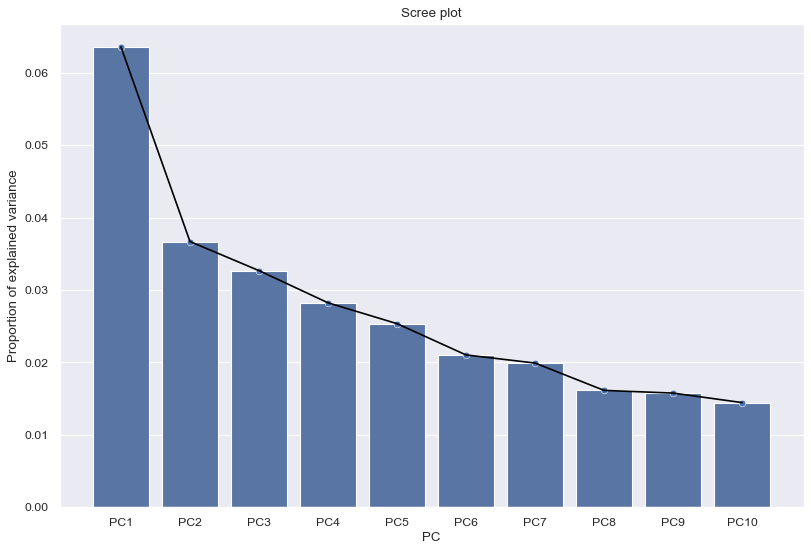

In [114]:
# Create data frame for plotting purposes
dfPCA = pd.DataFrame({'PC':['PC'+str(i) for i in range(1,11)],
        'Proportion of explained variance':pca.explained_variance_ratio_[0:10]})
plt.figure(figsize=(12, 8),dpi=80)
sns.barplot(data= dfPCA,x='PC',
           y = 'Proportion of explained variance',
           color='#4c72b0')
sns.scatterplot(data= dfPCA,x='PC',
         y = 'Proportion of explained variance',
         markers= "*")
sns.lineplot(data= dfPCA,x='PC',
         y = 'Proportion of explained variance',
         markers= "*",color='black')
plt.title('Scree plot')
# plt.savefig('q22.png', bbox_inches='tight',dpi=600)

Text(0.5, 1.0, 'Principal componets of 2 cell-lines samples')

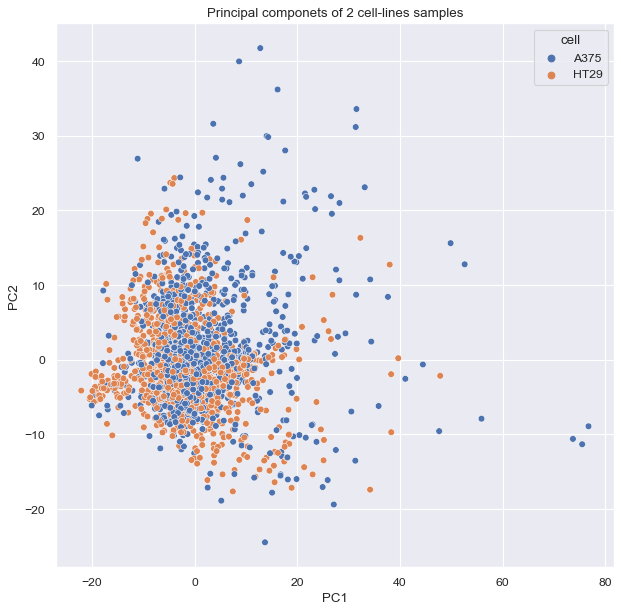

In [115]:
plt.figure(figsize=(9, 9),dpi=80)
sns.scatterplot(data=Xpca,x='PC1',y='PC2',
                hue='cell')
plt.title('Principal componets of 2 cell-lines samples')
#plt.savefig('q223.png', bbox_inches='tight',dpi=600)

In [116]:
X_tsne = TSNE(n_components=2,init= 'pca',perplexity=50,verbose=0).fit_transform(profiles.iloc[:,:-1])

C:\Users\nmeim\Anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(
C:\Users\nmeim\Anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


In [117]:
X_tsne = pd.DataFrame(X_tsne)
X_tsne.columns = ['Dim'+str(i) for i in range(1,3)]
X_tsne['cell'] = profiles.cell.values
X_tsne.index = profiles.index
#display(X_tsne)

Text(0.5, 1.0, 't-SNE plot of 2 cell-lines samples')

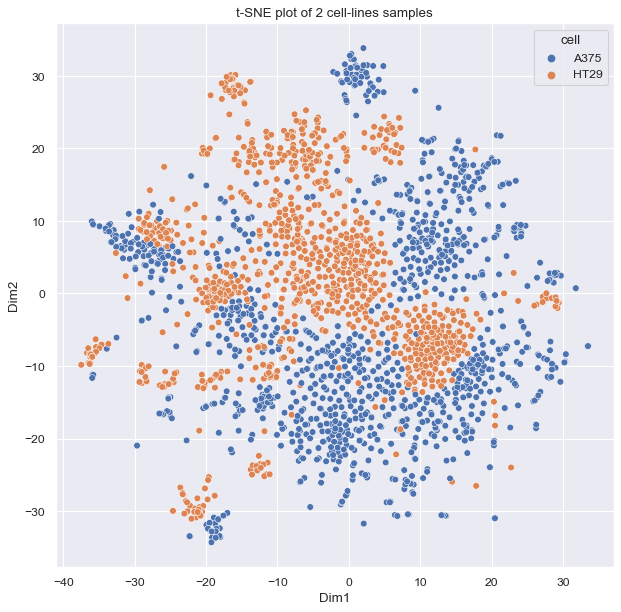

In [118]:
plt.figure(figsize=(9, 9),dpi=80)
sns.scatterplot(data=X_tsne,x='Dim1',y='Dim2',
                hue='cell')
plt.title('t-SNE plot of 2 cell-lines samples')
#plt.savefig('q223.png', bbox_inches='tight',dpi=600)

In [119]:
X_umap = umap.UMAP().fit_transform(profiles.iloc[:,:-1])

In [120]:
X_umap = pd.DataFrame(X_umap)
X_umap.columns = ['uMAP-'+str(i) for i in range(1,3)]
X_umap['cell'] = profiles.cell.values
X_umap.index = profiles.index
#display(X_umap)

Text(0.5, 1.0, 'u-MAP plot of 2 cell-lines samples')

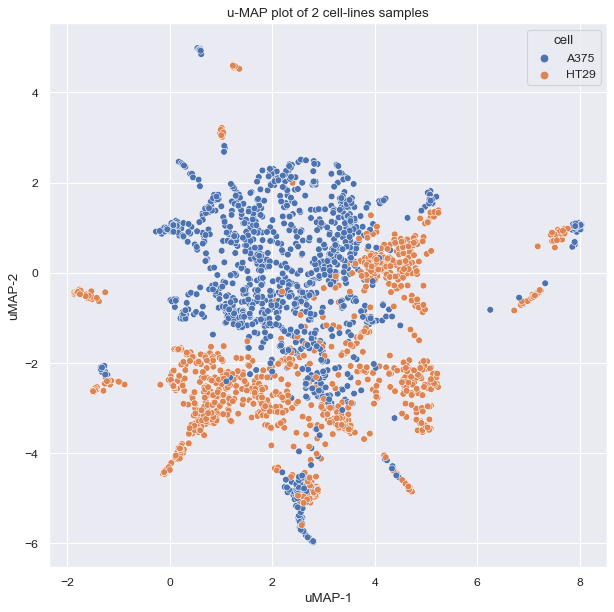

In [121]:
plt.figure(figsize=(9, 9),dpi=80)
sns.scatterplot(data=X_umap,x='uMAP-1',y='uMAP-2',
                hue='cell')
plt.title('u-MAP plot of 2 cell-lines samples')
#plt.savefig('q223.png', bbox_inches='tight',dpi=600)

# Loadings

In [122]:
# Find loadings
loadings = pca.components_
loadings = loadings[0:200]
loadings = loadings.transpose()
loadings = pd.DataFrame(loadings)
loadings.columns = ['PC'+str(i) for i in range(1,201)]
loadings['feature'] = profiles.columns[:-1]
display(loadings)

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC192,PC193,PC194,PC195,PC196,PC197,PC198,PC199,PC200,feature
0,0.031774,-0.011068,0.012453,-0.019561,-0.005035,0.004775,-0.006864,0.022755,-0.005781,-0.001848,...,-0.013603,-0.004311,0.003663,0.006471,-0.003305,0.022485,-0.004201,0.027937,-0.018084,9750
1,0.018191,-0.002221,0.011633,-0.020028,0.031108,-0.008003,0.021794,0.013721,-0.005342,-0.017365,...,0.015772,-0.001612,-0.043117,0.006844,0.001200,0.004457,-0.000457,-0.004854,-0.012144,54996
2,0.005150,-0.016758,0.002213,0.008246,-0.017681,0.025938,0.000164,0.014009,0.042536,0.005620,...,0.010190,-0.018168,0.021435,0.004786,0.044483,0.008930,-0.066674,-0.024988,-0.015462,23596
3,0.011783,-0.018146,0.012378,0.005170,0.013197,-0.001279,0.010660,-0.001917,-0.021136,0.003527,...,0.009041,-0.011416,0.032736,0.037916,-0.027671,0.010775,0.012368,0.035611,0.004157,23052
4,-0.037554,-0.001127,0.008980,0.002995,0.017291,-0.003826,0.012741,0.006208,-0.009275,0.002302,...,0.019542,-0.004592,0.021792,-0.008012,-0.007559,-0.066952,0.014505,-0.004856,0.005274,51493
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1615,0.038107,-0.026019,0.020530,0.013728,0.015099,0.011257,-0.008729,0.033973,0.025227,0.045092,...,0.015063,0.028777,0.003363,-0.001500,-0.022768,-0.024560,0.015417,0.029158,-0.009098,2774
1616,-0.001063,0.010552,0.025539,-0.011567,0.020136,0.015642,-0.034140,0.015817,0.004854,0.070144,...,0.002761,0.055702,-0.017409,0.036124,0.004806,-0.002810,0.000771,-0.019494,0.007884,7804
1617,0.014697,0.006806,0.004227,-0.050733,0.024015,0.020746,-0.007804,-0.013760,-0.040613,0.024990,...,0.028785,0.006125,0.001700,-0.010006,0.002425,-0.050655,0.045948,-0.003227,-0.012124,80021
1618,-0.012966,-0.071948,-0.026090,0.036748,0.002857,-0.038221,-0.031735,-0.030742,-0.027930,0.013721,...,-0.001040,-0.014015,-0.004291,0.003912,0.028535,-0.005427,0.036758,-0.001380,0.027583,10935


In [123]:
# Get the absolute average contributions
# of each loading accross the 200 PCs
loadImportance = abs(loadings.iloc[:,:-1]).mean(1)
display(loadImportance.sort_values(ascending=False)[0:400])

1088    0.048224
1084    0.046493
1546    0.044091
1433    0.043497
1428    0.043233
          ...   
51      0.018981
672     0.018978
299     0.018976
811     0.018965
541     0.018965
Length: 400, dtype: float64

In [124]:
# Print to see them
#print(profiles.columns[[1999,1821]])
print(profiles.columns[[1088,1084]])

Index(['6696', '154'], dtype='object')


Text(0.5, 1.0, 'Scatterplot based on 2 important features')

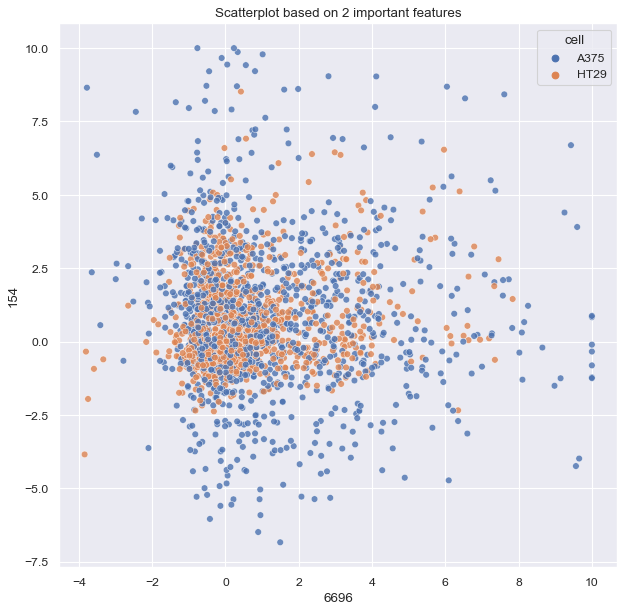

In [125]:
# 1st and 4th laodings
# have the highest contribution
plt.figure(figsize=(9, 9),dpi=80)
sns.scatterplot(data=profiles,x='6696',y='154',
                hue='cell',alpha=0.8)
plt.title('Scatterplot based on 2 important features')

# Random forest classifier

In [126]:
# Get X and Y matrices to fit

# Create X,Y matrix
X = profiles.iloc[:,:-1].values
Y = profiles.loc[:,'cell'].values

In [127]:
# Split into 80% training
# and 20% test set
# We specify a random_state for reproducability purposes.
# So that next time tha the data is pseudo-randomly split
# We get the same test and training sets.
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.20, random_state=42)

In [128]:
# Create a random forest classifier
classifier = RandomForestClassifier(random_state=11)
classifier.fit(X_train,Y_train)

RandomForestClassifier(random_state=11)

In [129]:
# Evaluate model accuracy
true_labels = Y_train
predicted_labels = classifier.predict(X_train)
tn, fp, fn, tp = confusion_matrix(true_labels,predicted_labels).ravel()
acc = (tn+tp)/true_labels.size
print('Training accuracy = %s'%acc)

Training accuracy = 1.0


In [130]:
# Test set evaluation
true_labels_test = Y_test
predicted_labels_test = classifier.predict(X_test)
tn, fp, fn, tp = confusion_matrix(true_labels_test,predicted_labels_test).ravel()
acc = (tn+tp)/true_labels_test.size
print('Test accuracy = %s'%acc)

Test accuracy = 0.9714912280701754


In [131]:
model = SelectFromModel(classifier,prefit=True)

In [132]:
importance = model.estimator.feature_importances_
dfImportance = pd.DataFrame({'Importance Score':importance,
                             'feature':profiles.columns.values[:-1]})
dfImportance = dfImportance.sort_values(by='Importance Score',
                                        ascending=False)
#dfImportance.to_csv('../results/Importance_results/RandomForestImportanceScores.csv')
display(dfImportance)

,Importance Score,feature
1400,0.031099,6192
1114,0.027645,7074
1428,0.024406,664
347,0.015341,8884
1341,0.014360,50810
...,...,...
1451,0.000015,83442
1583,0.000005,65080
656,0.000003,4739
199,0.000000,26053


## Scatterplot using the most important features

In [133]:
predicted_labels_all = classifier.predict(profiles.iloc[:,:-1].values)

In [134]:
# Create a data frame for visualization
# puroses
df = profiles.loc[:,['6192','7074']]
df['classification'] = predicted_labels_all
display(df)

,6192,7074,classification
sig_id,,,
CPC016_A375_6H:BRD-K70281171-103-01-1:10,-0.169102,-0.534369,A375
CPC016_HT29_6H:BRD-K06543683-066-01-3:10,0.701623,1.815320,HT29
PBIOA015_A375_24H:I05,-6.935214,-0.904765,A375
CPC016_A375_6H:BRD-A51410489-003-02-8:10,-0.272024,2.926762,A375
REP.A007_A375_24H:L01,-3.142541,-0.153857,A375
...,...,...,...
CPC008_A375_6H:P19,-0.399678,-1.832308,A375
CPC018_A375_6H:BRD-K63606607-001-01-8:10,-0.809002,-1.319768,A375
CPC008_HT29_6H:BRD-K96740880-001-05-5:10,0.312350,1.135186,HT29


Text(0.5, 1.0, 'Scatterplot in the space of the 2 most important features')

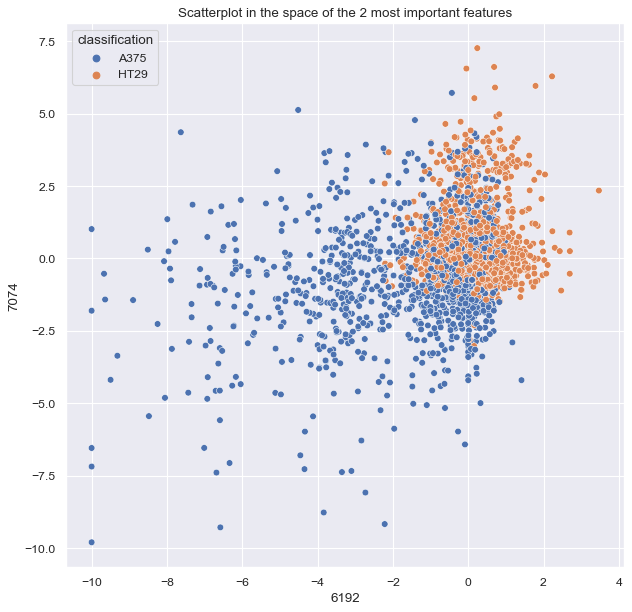

In [135]:
# Plot
plt.figure(figsize=(9, 9),dpi=80)
sns.scatterplot(data=df,x='6192',y='7074',
                hue = 'classification')
plt.title('Scatterplot in the space of the 2 most important features')
#plt.savefig('../figures/importantfeats_scatterplot.png', bbox_inches='tight',dpi=300)

## Visualize random forest

In [107]:
# Get tree of our classifier
tree.export_graphviz(classifier.estimators_[2], out_file='tree.dot', 
                feature_names = profiles.columns.values[:-1],
                class_names = ['HT29','A375'],
                rounded = True, proportion = False, 
                precision = 2, filled = True)

# Convert to png using system command (requires Graphviz)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree.png')